<a href="https://colab.research.google.com/github/kszymon/neural-network/blob/main/06_cnn%20/02_binary_classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Klasyfikator binarny - Image Classification - Drone vs. Passenger Plane

1. [Import bibliotek](#a0)
2. [Załadowanie danych](#a1)
3. [Przygotowanie zbiorów: treningowego, walidacyjnego i testowego](#a2)
4. [Eksplorcja danych](#a3)
5. [Augmentacja danych](#a4)
6. [Budowa modelu](#a5)
7. [Transfer learning - model VGG16](#a6)
8. [Transfer learning - model VGG16 - odmrożenie kilku ostatnich warstw](#a7)
9. [Ocena modelu na zbiorze testowym](#a8)
10. [Wyświetlenie błędów predykcji](#a9)

### <a name='a0'></a> Import bibliotek

In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import shutil
import plotly.graph_objects as go
from sklearn.metrics import confusion_matrix, classification_report

from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras import optimizers
from tensorflow.keras.callbacks import TensorBoard

np.set_printoptions(precision=6, suppress=True)

### <a name='a1'></a> Załadowanie danych

In [4]:
# !wget https://storage.googleapis.com/esmartdata-courses-files/ann-course/flying-vehicles.zip
# !unzip -q flying-vehicles.zip

--2025-05-11 08:57:34--  https://storage.googleapis.com/esmartdata-courses-files/ann-course/flying-vehicles.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 64.233.188.207, 64.233.189.207, 108.177.97.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|64.233.188.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1540232238 (1.4G) [application/x-zip-compressed]
Saving to: ‘flying-vehicles.zip’

flying-vehicles.zip 100%[===================>]   1.43G  13.0MB/s    in 1m 56s  

2025-05-11 08:59:32 (12.6 MB/s) - ‘flying-vehicles.zip’ saved [1540232238/1540232238]



### <a name='a2'></a> Przygotowanie zbiorów: treningowego, walidacyjnego i testowego

In [5]:
!rm -rf ./images

In [6]:
base_dir = './data/planes'
raw_no_of_files = {}
classes = ['drone', 'fighter-jet', 'helicopter', 'missile', 'passenger-plane', 'rocket']
for dir in classes:
    raw_no_of_files[dir] = len(os.listdir(os.path.join(base_dir, dir)))

raw_no_of_files.items()

dict_items([('drone', 1332), ('fighter-jet', 1867), ('helicopter', 1387), ('missile', 1334), ('passenger-plane', 1424), ('rocket', 1186)])

In [7]:
data_dir = './images'

if not os.path.exists(data_dir):
    os.mkdir(data_dir)

train_dir = os.path.join(data_dir, 'train')    # katalog zbioru treningowego
valid_dir = os.path.join(data_dir, 'valid')    # katalog zbioru walidacyjnego
test_dir = os.path.join(data_dir, 'test')      # katalog zbioru testowego

train_drone_dir = os.path.join(train_dir, 'drone')
train_passenger_dir = os.path.join(train_dir, 'passenger')

valid_drone_dir = os.path.join(valid_dir, 'drone')
valid_passenger_dir = os.path.join(valid_dir, 'passenger')

test_drone_dir = os.path.join(test_dir, 'drone')
test_passenger_dir = os.path.join(test_dir, 'passenger')

for directory in (train_dir, valid_dir, test_dir):
    if not os.path.exists(directory):
        os.mkdir(directory)

dirs = [train_drone_dir, train_passenger_dir, valid_drone_dir, valid_passenger_dir, test_drone_dir, test_passenger_dir]

for dir in dirs:
    if not os.path.exists(dir):
        os.mkdir(dir)

In [8]:
drone_fnames = os.listdir(os.path.join(base_dir, 'drone'))
passenger_fnames = os.listdir(os.path.join(base_dir, 'passenger-plane'))

drone_fnames = [fname for fname in drone_fnames if fname.split('.')[1].lower() in ['jpg', 'png', 'jpeg']]
passenger_fnames = [fname for fname in passenger_fnames if fname.split('.')[1].lower() in ['jpg', 'png', 'jpeg']]

In [9]:
size = min(len(drone_fnames), len(passenger_fnames))

train_size = int(np.floor(0.7 * size))
valid_size = int(np.floor(0.2 * size))
test_size = size - train_size - valid_size

train_idx = train_size
valid_idx = train_size + valid_size
test_idx = train_size + valid_size + test_size

In [10]:
for i, fname in enumerate(drone_fnames):
    if i <= train_idx:
        src = os.path.join(base_dir, 'drone', fname)
        dst = os.path.join(train_drone_dir, fname)
        shutil.copyfile(src, dst)
    elif train_idx < i <= valid_idx:
        src = os.path.join(base_dir, 'drone', fname)
        dst = os.path.join(valid_drone_dir, fname)
        shutil.copyfile(src, dst)
    elif valid_idx < i < test_idx:
        src = os.path.join(base_dir, 'drone', fname)
        dst = os.path.join(test_drone_dir, fname)
        shutil.copyfile(src, dst)

for i, fname in enumerate(passenger_fnames):
    if i <= train_idx:
        src = os.path.join(base_dir, 'passenger-plane', fname)
        dst = os.path.join(train_passenger_dir, fname)
        shutil.copyfile(src, dst)
    elif train_idx < i <= valid_idx:
        src = os.path.join(base_dir, 'passenger-plane', fname)
        dst = os.path.join(valid_passenger_dir, fname)
        shutil.copyfile(src, dst)
    elif valid_idx < i < test_idx:
        src = os.path.join(base_dir, 'passenger-plane', fname)
        dst = os.path.join(test_passenger_dir, fname)
        shutil.copyfile(src, dst)

print('drone - zbiór treningowy', len(os.listdir(train_drone_dir)))
print('drone - zbiór walidacyjny', len(os.listdir(valid_drone_dir)))
print('drone - zbiór testowy', len(os.listdir(test_drone_dir)))

print('passenger - zbiór treningowy', len(os.listdir(train_passenger_dir)))
print('passenger - zbiór walidacyjny', len(os.listdir(valid_passenger_dir)))
print('passenger - zbiór testowy', len(os.listdir(test_passenger_dir)))

drone - zbiór treningowy 919
drone - zbiór walidacyjny 262
drone - zbiór testowy 131
passenger - zbiór treningowy 919
passenger - zbiór walidacyjny 262
passenger - zbiór testowy 131


### <a name='a3'></a> Eksplorcja danych

(np.float64(-0.5), np.float64(1919.5), np.float64(1079.5), np.float64(-0.5))

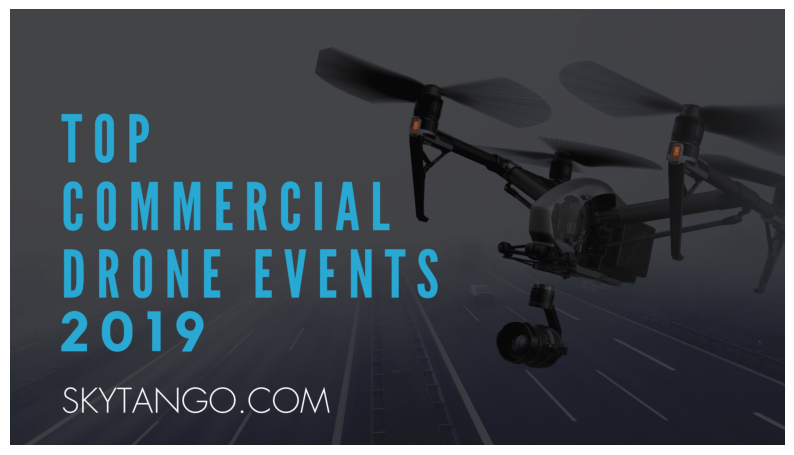

In [14]:
#@title Wybierz indeks przykładowego zdjęcia drona ze zbioru treningowego:

idx = 371 #@param {type:'slider', min:0, max:919}
names_mapping = dict(enumerate(drone_fnames))
img_path = os.path.join(train_drone_dir, names_mapping[idx])

img = image.load_img(img_path)

plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.grid(False)
plt.axis(False)

(np.float64(-0.5), np.float64(619.5), np.float64(725.5), np.float64(-0.5))

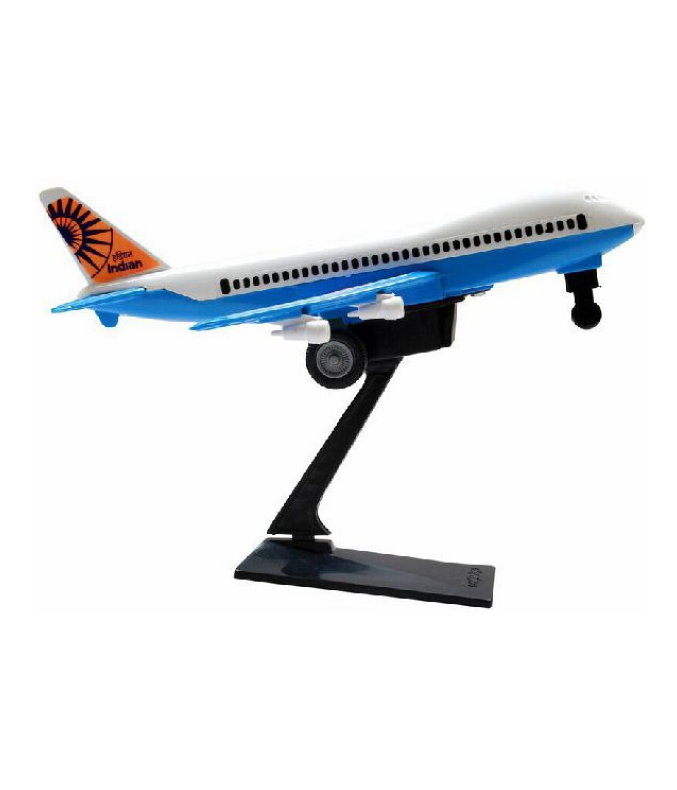

In [15]:
#@title Wybierz indeks przykładowego zdjęcia samolotu pasażerskiego ze zbioru treningowego:

idx = 699 #@param {type:'slider', min:0, max:919}
names_mapping = dict(enumerate(passenger_fnames))
img_path = os.path.join(train_passenger_dir, names_mapping[idx])

img = image.load_img(img_path)

plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.grid(False)
plt.axis(False)

### <a name='a4'></a> Augmentcja danych

In [16]:
train_datagen = ImageDataGenerator(
    rotation_range=40,     # zakres kąta o który losowo zostanie wykonany obrót obrazów
    rescale=1./255.,
    width_shift_range=0.2,  # pionowe przekształcenia obrazu
    height_shift_range=0.2, # poziome przekształcenia obrazu
    shear_range=0.2,        # zares losowego przycianania obrazu
    zoom_range=0.2,         # zakres losowego przybliżania obrazu
    horizontal_flip=True,   # losowe odbicie połowy obrazu w płaszczyźnie poziomej
    fill_mode='nearest'     # strategia wypełniania nowo utworzonych pikseli, któe mogą powstać w wyniku przekształceń
)

# przeskalowujemy wszystkie obrazy o współczynnik 1/255
valid_datagen = ImageDataGenerator(rescale=1./255.)

train_generator = train_datagen.flow_from_directory(directory=train_dir,
                                                   target_size=(150, 150),
                                                   batch_size=32,
                                                   class_mode='binary')

valid_generator = valid_datagen.flow_from_directory(directory=valid_dir,
                                                   target_size=(150, 150),
                                                   batch_size=32,
                                                   class_mode='binary')

Found 1838 images belonging to 2 classes.
Found 524 images belonging to 2 classes.


In [17]:
def display_augmented_images(directory, idx):
    """
    Funkcja zwraca wykres przykładowych obrazów uzyskanych za pomocą techniki
    augmentacji danych.
    """
    fnames = [os.path.join(directory, fname) for fname in os.listdir(directory)]
    img_path = fnames[idx]
    img = image.load_img(img_path, target_size=(150, 150))

    x = image.img_to_array(img)
    x = x.reshape((1, ) + x.shape)

    i = 1
    plt.figure(figsize=(16, 8))
    for batch in train_datagen.flow(x, batch_size=1):
        plt.subplot(3, 4, i)
        plt.grid(False)
        imgplot = plt.imshow(image.array_to_img(batch[0]))
        i += 1
        if i % 13 == 0:
            break

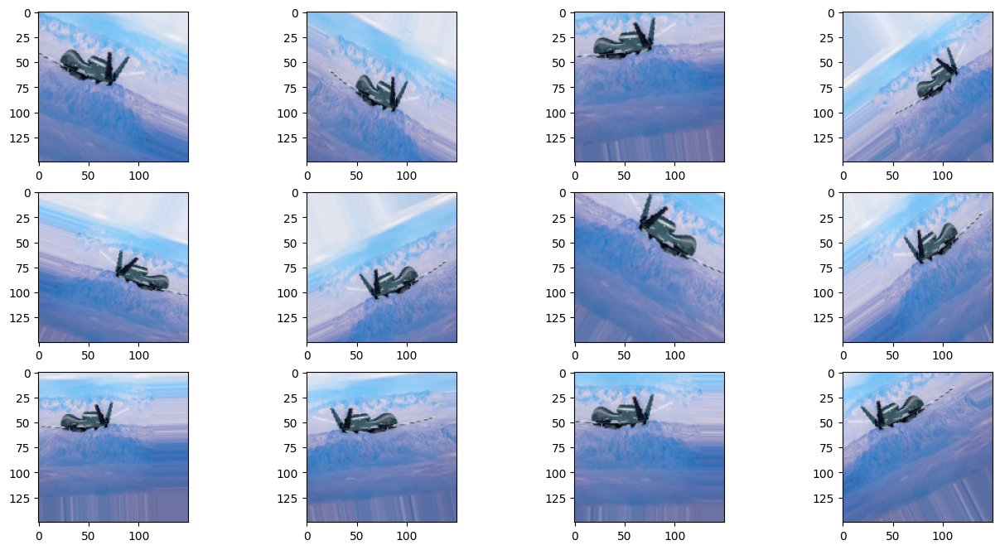

In [18]:
#@title Zbiór treningowy drone:
idx = 467 #@param {type:'slider', min:0, max:919}
display_augmented_images(train_drone_dir, idx)

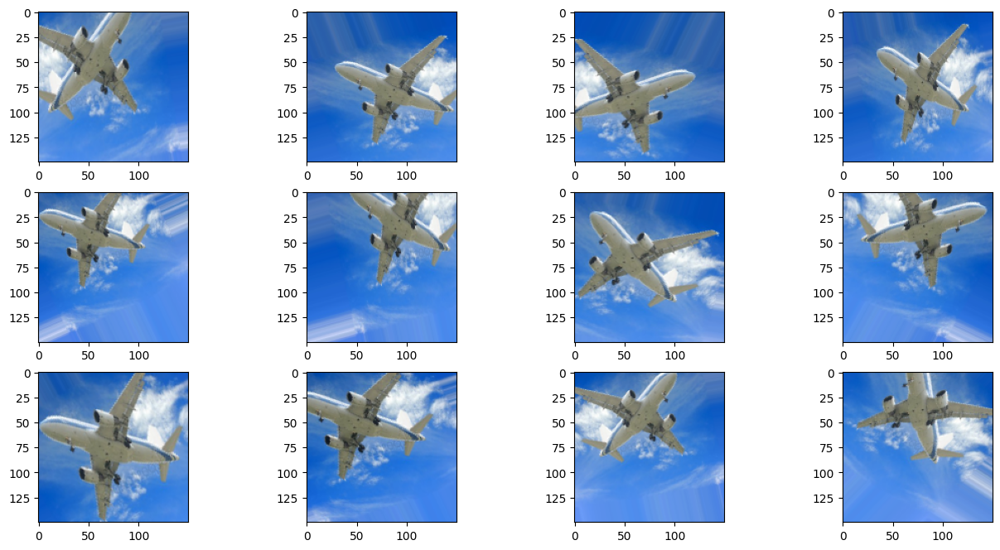

In [20]:
#@title Zbiór treningowy passenger:
idx = 775 #@param {type:'slider', min:0, max:919}
display_augmented_images(train_passenger_dir, idx)

### <a name='a5'></a> Budowa modelu

In [21]:
model = Sequential()
model.add(layers.Conv2D(filters=32, kernel_size=(3, 3), activation='relu', input_shape=(150, 150, 3)))
model.add(layers.MaxPooling2D(pool_size=(2, 2)))
model.add(layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
model.add(layers.MaxPooling2D(pool_size=(2, 2)))
model.add(layers.Conv2D(filters=128, kernel_size=(3, 3), activation='relu'))
model.add(layers.MaxPooling2D(pool_size=(2, 2)))
model.add(layers.Conv2D(filters=128, kernel_size=(3, 3), activation='relu'))
model.add(layers.MaxPooling2D(pool_size=(2, 2)))
model.add(layers.Flatten())
model.add(layers.Dense(units=512, activation='relu'))
model.add(layers.Dense(units=1, activation='sigmoid'))
model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 15, 15, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 6272)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     3,211,776 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,453,121 (13.17 MB)

 Trainable params: 3,453,121 (13.17 MB)

 Non-trainable params: 0 (0.00 B)

In [23]:
model.compile(optimizer=optimizers.RMSprop(learning_rate=1e-4),
             loss='binary_crossentropy',
             metrics=['accuracy'])

In [24]:
!rm -rf logs
!mkdir logs

tensorboard = TensorBoard(log_dir='logs')

In [26]:
batch_size = 32
steps_per_epoch = train_size // batch_size
validation_steps = valid_size // batch_size

history = model.fit(train_generator,
                   steps_per_epoch=steps_per_epoch,
                   epochs=30,
                   validation_data=valid_generator,
                   validation_steps=validation_steps,
                   callbacks=[tensorboard])

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 73s 2s/step - accuracy: 0.5365 - loss: 0.6951 - val_accuracy: 0.5586 - val_loss: 0.6864
Epoch 2/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 82s 3s/step - accuracy: 0.5280 - loss: 0.6938 - val_accuracy: 0.4883 - val_loss: 0.6927
Epoch 3/30
 2/28 ━━━━━━━━━━━━━━━━━━━━ 33s 1s/step - accuracy: 0.5000 - loss: 0.6928

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


28/28 ━━━━━━━━━━━━━━━━━━━━ 9s 275ms/step - accuracy: 0.5000 - loss: 0.6940 - val_accuracy: 0.6055 - val_loss: 0.6846
Epoch 4/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 143s 4s/step - accuracy: 0.5271 - loss: 0.6879 - val_accuracy: 0.5430 - val_loss: 0.6814
Epoch 5/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 83s 3s/step - accuracy: 0.5531 - loss: 0.6861 - val_accuracy: 0.5000 - val_loss: 0.6914
Epoch 6/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 11s 361ms/step - accuracy: 0.5162 - loss: 0.6810 - val_accuracy: 0.5625 - val_loss: 0.6802
Epoch 7/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 82s 3s/step - accuracy: 0.5572 - loss: 0.6839 - val_accuracy: 0.5625 - val_loss: 0.6752
Epoch 8/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 141s 5s/step - accuracy: 0.5831 - loss: 0.6817 - val_accuracy: 0.5664 - val_loss: 0.6671
Epoch 9/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 21s 724ms/step - accuracy: 0.5938 - loss: 0.6607 - val_accuracy: 0.5859 - val_loss: 0.6599
Epoch 10/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 141s 4s/step - accuracy: 0.5863 - loss: 0.6799 - val_accuracy: 0.5820 - val_loss

In [28]:
%load_ext tensorboard

In [29]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [30]:
def plot_hist(history):
    hist = pd.DataFrame(history.history)
    hist['epoch'] = history.epoch

    fig = go.Figure()
    fig.add_trace(go.Scatter(x=hist['epoch'], y=hist['accuracy'], name='accuracy', mode='markers+lines'))
    fig.add_trace(go.Scatter(x=hist['epoch'], y=hist['val_accuracy'], name='val_accuracy', mode='markers+lines'))
    fig.update_layout(width=1000, height=500, title='Accuracy vs. Val Accuracy', xaxis_title='Epoki', yaxis_title='Accuracy', yaxis_type='log')
    fig.show()

    fig = go.Figure()
    fig.add_trace(go.Scatter(x=hist['epoch'], y=hist['loss'], name='loss', mode='markers+lines'))
    fig.add_trace(go.Scatter(x=hist['epoch'], y=hist['val_loss'], name='val_loss', mode='markers+lines'))
    fig.update_layout(width=1000, height=500, title='Loss vs. Val Loss', xaxis_title='Epoki', yaxis_title='Loss', yaxis_type='log')
    fig.show()

plot_hist(history)

### <a name='a6'></a> Transfer learning - model VGG16

In [31]:
from tensorflow.keras.applications import VGG16

conv_base = VGG16(weights='imagenet', include_top=False, input_shape=(150, 150, 3))
conv_base.summary()

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 150, 150, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 150, 150, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 75, 75, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 75, 75, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 37, 37, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 18, 18, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 4, 4, 512)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

In [32]:
model = Sequential()
model.add(conv_base)
model.add(layers.Flatten())
model.add(layers.Dense(units=256, activation='relu'))
model.add(layers.Dense(units=1, activation='sigmoid'))
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 4, 4, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │     2,097,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,812,353 (64.13 MB)

 Trainable params: 16,812,353 (64.13 MB)

 Non-trainable params: 0 (0.00 B)

In [33]:
print(f'Liczba warstw trenowanych przed zamrożeniem {len(model.trainable_weights)}')
conv_base.trainable = False
print(f'Liczba warstw trenowanych po zamrożeniu {len(model.trainable_weights)}')

Liczba warstw trenowanych przed zamrożeniem 30
Liczba warstw trenowanych po zamrożeniu 4


In [34]:
model.compile(optimizer=optimizers.RMSprop(learning_rate=1e-4),
             loss='binary_crossentropy',
             metrics=['accuracy'])

In [35]:
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=50,    # 100
                    validation_data=valid_generator,
                    validation_steps=validation_steps,
                    callbacks=[tensorboard])

Epoch 1/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 349s 12s/step - accuracy: 0.6094 - loss: 0.7144 - val_accuracy: 0.7344 - val_loss: 0.5552
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 338s 12s/step - accuracy: 0.7154 - loss: 0.5537 - val_accuracy: 0.7734 - val_loss: 0.4920
Epoch 3/50
 2/28 ━━━━━━━━━━━━━━━━━━━━ 5:19 12s/step - accuracy: 0.6719 - loss: 0.5850

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning:

Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.



28/28 ━━━━━━━━━━━━━━━━━━━━ 110s 4s/step - accuracy: 0.6574 - loss: 0.5570 - val_accuracy: 0.7695 - val_loss: 0.4687
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 372s 13s/step - accuracy: 0.7024 - loss: 0.5562 - val_accuracy: 0.7656 - val_loss: 0.4558
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 297s 11s/step - accuracy: 0.7410 - loss: 0.5148 - val_accuracy: 0.7695 - val_loss: 0.4464
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 157s 5s/step - accuracy: 0.8265 - loss: 0.3959 - val_accuracy: 0.7734 - val_loss: 0.4445
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 383s 12s/step - accuracy: 0.7455 - loss: 0.4752 - val_accuracy: 0.7148 - val_loss: 0.6067
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 388s 14s/step - accuracy: 0.7503 - loss: 0.5120 - val_accuracy: 0.8125 - val_loss: 0.4150
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 134s 5s/step - accuracy: 0.7511 - loss: 0.4662 - val_accuracy: 0.7734 - val_loss: 0.4308
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 358s 13s/step - accuracy: 0.7976 - loss: 0.4367 - val_accuracy: 0.7930 - val_lo

In [36]:
import plotly.graph_objects as go
plot_hist(history)

### <a name='a7'></a> Transfer learning - model VGG16 - odmrożenie kilku ostatnich warstw

In [37]:
conv_base = VGG16(weights='imagenet', include_top=False, input_shape=(150, 150, 3))
conv_base.trainable = True

def print_layers(model):
    for layer in model.layers:
        print(f'layer_name: {layer.name:13} trainable: {layer.trainable}')

print_layers(conv_base)

layer_name: input_layer_3 trainable: True
layer_name: block1_conv1  trainable: True
layer_name: block1_conv2  trainable: True
layer_name: block1_pool   trainable: True
layer_name: block2_conv1  trainable: True
layer_name: block2_conv2  trainable: True
layer_name: block2_pool   trainable: True
layer_name: block3_conv1  trainable: True
layer_name: block3_conv2  trainable: True
layer_name: block3_conv3  trainable: True
layer_name: block3_pool   trainable: True
layer_name: block4_conv1  trainable: True
layer_name: block4_conv2  trainable: True
layer_name: block4_conv3  trainable: True
layer_name: block4_pool   trainable: True
layer_name: block5_conv1  trainable: True
layer_name: block5_conv2  trainable: True
layer_name: block5_conv3  trainable: True
layer_name: block5_pool   trainable: True


In [38]:
set_trainable = False
for layer in conv_base.layers:
    if layer.name == 'block5_conv1':
        set_trainable = True
    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False

print_layers(conv_base)

layer_name: input_layer_3 trainable: False
layer_name: block1_conv1  trainable: False
layer_name: block1_conv2  trainable: False
layer_name: block1_pool   trainable: False
layer_name: block2_conv1  trainable: False
layer_name: block2_conv2  trainable: False
layer_name: block2_pool   trainable: False
layer_name: block3_conv1  trainable: False
layer_name: block3_conv2  trainable: False
layer_name: block3_conv3  trainable: False
layer_name: block3_pool   trainable: False
layer_name: block4_conv1  trainable: False
layer_name: block4_conv2  trainable: False
layer_name: block4_conv3  trainable: False
layer_name: block4_pool   trainable: False
layer_name: block5_conv1  trainable: True
layer_name: block5_conv2  trainable: True
layer_name: block5_conv3  trainable: True
layer_name: block5_pool   trainable: True


In [39]:
model = Sequential()
model.add(conv_base)
model.add(layers.Flatten())
model.add(layers.Dense(units=256, activation='relu'))
model.add(layers.Dense(units=1, activation='sigmoid'))

model.compile(optimizer=optimizers.RMSprop(learning_rate=1e-5),
             loss='binary_crossentropy',
             metrics=['accuracy'])

model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 4, 4, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 256)            │     2,097,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,812,353 (64.13 MB)

 Trainable params: 9,177,089 (35.01 MB)

 Non-trainable params: 7,635,264 (29.13 MB)

In [40]:
history = model.fit(train_generator,
                             steps_per_epoch=steps_per_epoch,
                             epochs=30,    # 100
                             validation_data=valid_generator,
                             validation_steps=validation_steps,
                             callbacks=[tensorboard])

Epoch 1/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 325s 12s/step - accuracy: 0.5214 - loss: 0.6939 - val_accuracy: 0.6250 - val_loss: 0.6299
Epoch 2/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 322s 12s/step - accuracy: 0.6972 - loss: 0.5881 - val_accuracy: 0.7617 - val_loss: 0.5083
Epoch 3/30
 2/28 ━━━━━━━━━━━━━━━━━━━━ 4:02 9s/step - accuracy: 0.7969 - loss: 0.5189

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning:

Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.



28/28 ━━━━━━━━━━━━━━━━━━━━ 82s 3s/step - accuracy: 0.7533 - loss: 0.5464 - val_accuracy: 0.7305 - val_loss: 0.5397
Epoch 4/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 382s 13s/step - accuracy: 0.7482 - loss: 0.5290 - val_accuracy: 0.7773 - val_loss: 0.4531
Epoch 5/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 320s 12s/step - accuracy: 0.7535 - loss: 0.4794 - val_accuracy: 0.7852 - val_loss: 0.4449
Epoch 6/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 82s 3s/step - accuracy: 0.7522 - loss: 0.4977 - val_accuracy: 0.7305 - val_loss: 0.4878
Epoch 7/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 313s 11s/step - accuracy: 0.7607 - loss: 0.4732 - val_accuracy: 0.7891 - val_loss: 0.4114
Epoch 8/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 323s 12s/step - accuracy: 0.7962 - loss: 0.4492 - val_accuracy: 0.8281 - val_loss: 0.3669
Epoch 9/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 83s 3s/step - accuracy: 0.7673 - loss: 0.4411 - val_accuracy: 0.8008 - val_loss: 0.3952
Epoch 10/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 321s 12s/step - accuracy: 0.7908 - loss: 0.4088 - val_accuracy: 0.7969 - val_loss:

In [41]:
plot_hist(history)

### <a name='a8'></a> Ocena modelu na zbiorze testowym

In [43]:
test_datagen = ImageDataGenerator(rescale=1./255.)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(150, 150),
    batch_size=1,
    class_mode='binary',
    shuffle=False
)

y_prob = model.predict(test_generator, test_generator.samples)
y_prob = y_prob.ravel()
y_prob

Found 262 images belonging to 2 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.



262/262 ━━━━━━━━━━━━━━━━━━━━ 68s 258ms/step


array([0.000302, 0.005158, 0.005283, 0.002182, 0.0002  , 0.000848,
       0.004288, 0.153923, 0.000488, 0.062989, 0.761086, 0.020392,
       0.000214, 0.004001, 0.022892, 0.108365, 0.033988, 0.206505,
       0.015335, 0.018814, 0.004867, 0.136838, 0.704881, 0.019625,
       0.000435, 0.062304, 0.26649 , 0.002664, 0.217669, 0.455069,
       0.018513, 0.04226 , 0.083342, 0.000124, 0.028651, 0.006711,
       0.015442, 0.00098 , 0.046464, 0.016774, 0.032324, 0.000433,
       0.156385, 0.00697 , 0.003073, 0.007256, 0.071158, 0.017814,
       0.59704 , 0.001514, 0.099654, 0.202639, 0.005557, 0.841221,
       0.002584, 0.080779, 0.470256, 0.012149, 0.907105, 0.045731,
       0.010972, 0.027169, 0.045064, 0.001395, 0.091163, 0.046131,
       0.002398, 0.04783 , 0.008134, 0.025686, 0.294231, 0.515549,
       0.168169, 0.231251, 0.010032, 0.821257, 0.054515, 0.013299,
       0.601105, 0.170937, 0.060738, 0.000358, 0.073622, 0.46953 ,
       0.44508 , 0.532305, 0.515649, 0.680947, 0.370697, 0.006

In [44]:
predictions  = pd.DataFrame({'y_prob': y_prob})
predictions['class'] = predictions['y_prob'].apply(lambda x: 1 if x > 0.5 else 0)
predictions

,y_prob,class
0,0.000302,0
1,0.005158,0
2,0.005283,0
3,0.002182,0
4,0.000200,0
...,...,...
257,0.369786,0
258,0.567208,1
259,0.953677,1
260,0.527621,1


In [45]:
y_true = test_generator.classes
y_true

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
      dtype=int32)

In [46]:
y_pred = predictions['class'].values
y_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0,
       1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1,
       0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1,
       0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1])

In [47]:
test_generator.class_indices

{'drone': 0, 'passenger': 1}

In [48]:
cm = confusion_matrix(y_true, y_pred)
cm

array([[110,  21],
       [ 26, 105]])

In [49]:
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.81      0.84      0.82       131
           1       0.83      0.80      0.82       131

    accuracy                           0.82       262
   macro avg       0.82      0.82      0.82       262
weighted avg       0.82      0.82      0.82       262



### <a name='a9'></a> Wyświetlenie błędów predykcji

In [50]:
errors = pd.DataFrame({'y_true': y_true, 'y_pred': y_pred}, index=test_generator.filenames)
errors.head()

,y_true,y_pred
drone/00000000.jpg,0,0
drone/00000008.jpg,0,0
drone/00000047.jpg,0,0
drone/00000058.jpg,0,0
drone/00000062.jpg,0,0


In [51]:
errors['is_incorrect'] = (errors['y_true'] != errors['y_pred']) * 1
errors

,y_true,y_pred,is_incorrect
drone/00000000.jpg,0,0,0
drone/00000008.jpg,0,0,0
drone/00000047.jpg,0,0,0
drone/00000058.jpg,0,0,0
drone/00000062.jpg,0,0,0
...,...,...,...
passenger/00001471.jpg,1,0,1
passenger/00001477.jpg,1,1,0
passenger/00001480.jpg,1,1,0
passenger/00001484.jpg,1,1,0


In [52]:
errors[errors['is_incorrect'] == 1].index

Index(['drone/00000112.png', 'drone/00000304.jpeg', 'drone/00000550.jpg',
       'drone/00000594.jpg', 'drone/00000656.jpg', 'drone/00000787.png',
       'drone/00000806.jpg', 'drone/00000855.jpg', 'drone/00000910.jpg',
       'drone/00000929.jpg', 'drone/00000941.jpg', 'drone/00000955.jpg',
       'drone/00001001.jpg', 'drone/00001112.jpg', 'drone/00001137.jpg',
       'drone/00001269.jpeg', 'drone/00001282.jpg', 'drone/00001332.jpg',
       'drone/00001352.jpg', 'drone/00001357.jpg', 'drone/00001385.jpg',
       'passenger/00000006.jpg', 'passenger/00000062.jpg',
       'passenger/00000071.jpg', 'passenger/00000161.jpg',
       'passenger/00000353.jpg', 'passenger/00000367.jpg',
       'passenger/00000410.jpg', 'passenger/00000490.jpg',
       'passenger/00000550.jpg', 'passenger/00000578.png',
       'passenger/00000589.jpg', 'passenger/00000660.jpg',
       'passenger/00000676.jpg', 'passenger/00000689.jpg',
       'passenger/00000734.png', 'passenger/00000735.jpg',
       'passeng

(np.float64(-0.5), np.float64(2047.5), np.float64(1486.5), np.float64(-0.5))

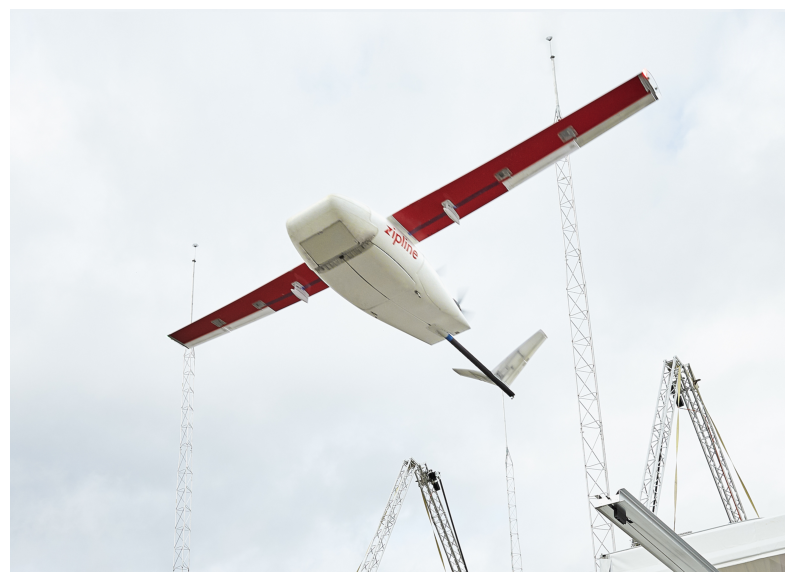

In [60]:
img_path = os.path.join(test_drone_dir, '00000304.jpeg')

img = image.load_img(img_path)

plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.grid(False)
plt.axis(False)

In [61]:
errors[errors['is_incorrect'] == 1].index

Index(['drone/00000112.png', 'drone/00000304.jpeg', 'drone/00000550.jpg',
       'drone/00000594.jpg', 'drone/00000656.jpg', 'drone/00000787.png',
       'drone/00000806.jpg', 'drone/00000855.jpg', 'drone/00000910.jpg',
       'drone/00000929.jpg', 'drone/00000941.jpg', 'drone/00000955.jpg',
       'drone/00001001.jpg', 'drone/00001112.jpg', 'drone/00001137.jpg',
       'drone/00001269.jpeg', 'drone/00001282.jpg', 'drone/00001332.jpg',
       'drone/00001352.jpg', 'drone/00001357.jpg', 'drone/00001385.jpg',
       'passenger/00000006.jpg', 'passenger/00000062.jpg',
       'passenger/00000071.jpg', 'passenger/00000161.jpg',
       'passenger/00000353.jpg', 'passenger/00000367.jpg',
       'passenger/00000410.jpg', 'passenger/00000490.jpg',
       'passenger/00000550.jpg', 'passenger/00000578.png',
       'passenger/00000589.jpg', 'passenger/00000660.jpg',
       'passenger/00000676.jpg', 'passenger/00000689.jpg',
       'passenger/00000734.png', 'passenger/00000735.jpg',
       'passeng

(np.float64(-0.5), np.float64(589.5), np.float64(349.5), np.float64(-0.5))

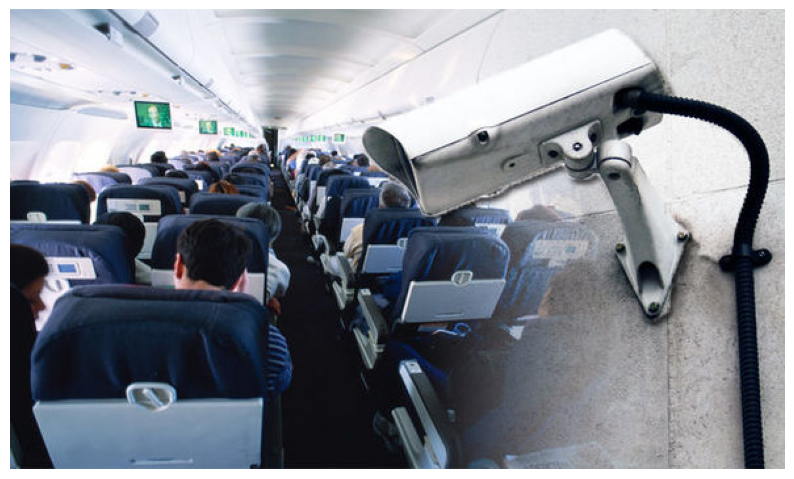

In [63]:
img_path = os.path.join(test_passenger_dir, '00000550.jpg')

img = image.load_img(img_path)

plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.grid(False)
plt.axis(False)